In [1]:
import pandas as pd
import streamlit as st
from sklearn.preprocessing import LabelEncoder
import numpy as np

In [2]:
filepath_2002_2012 ="D://Learning//Projects//SingaporeFlatePricePrediction//Data//ResaleFlatPricesBasedonApprovalDate2000Feb2012.csv"
filepath_1990_1999 ="D://Learning//Projects//SingaporeFlatePricePrediction//Data//ResaleFlatPricesBasedonApprovalDate19901999.csv"
filepath_2015_2016 ="D://Learning//Projects//SingaporeFlatePricePrediction//Data//ResaleFlatPricesBasedonRegistrationDateFromJan2015toDec2016.csv"
filepath_2012_2014 ="D://Learning//Projects//SingaporeFlatePricePrediction//Data//ResaleFlatPricesBasedonRegistrationDateFromMar2012toDec2014.csv"
filepath_2017_2024 ="D://Learning//Projects//SingaporeFlatePricePrediction//Data//ResaleflatpricesbasedonregistrationdatefromJan2017onwards.csv"


In [3]:
df_02_12=pd.read_csv(filepath_2002_2012)
df_90_99=pd.read_csv(filepath_1990_1999)
df_15_16=pd.read_csv(filepath_2015_2016)
df_12_14=pd.read_csv(filepath_2012_2014)
df_17_24=pd.read_csv(filepath_2017_2024)


In [4]:
# Display the first few rows and summary information
df_02_12.head(), df_02_12.info(), df_02_12.describe(include='all')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 369651 entries, 0 to 369650
Data columns (total 10 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                369651 non-null  object 
 1   town                 369651 non-null  object 
 2   flat_type            369651 non-null  object 
 3   block                369651 non-null  object 
 4   street_name          369651 non-null  object 
 5   storey_range         369651 non-null  object 
 6   floor_area_sqm       369651 non-null  float64
 7   flat_model           369651 non-null  object 
 8   lease_commence_date  369651 non-null  int64  
 9   resale_price         369651 non-null  float64
dtypes: float64(2), int64(1), object(7)
memory usage: 28.2+ MB


(     month        town flat_type block       street_name storey_range  \
 0  2000-01  ANG MO KIO    3 ROOM   170  ANG MO KIO AVE 4     07 TO 09   
 1  2000-01  ANG MO KIO    3 ROOM   174  ANG MO KIO AVE 4     04 TO 06   
 2  2000-01  ANG MO KIO    3 ROOM   216  ANG MO KIO AVE 1     07 TO 09   
 3  2000-01  ANG MO KIO    3 ROOM   215  ANG MO KIO AVE 1     07 TO 09   
 4  2000-01  ANG MO KIO    3 ROOM   218  ANG MO KIO AVE 1     07 TO 09   
 
    floor_area_sqm      flat_model  lease_commence_date  resale_price  
 0            69.0        Improved                 1986      147000.0  
 1            61.0        Improved                 1986      144000.0  
 2            73.0  New Generation                 1976      159000.0  
 3            73.0  New Generation                 1976      167000.0  
 4            67.0  New Generation                 1976      163000.0  ,
 None,
           month       town flat_type   block     street_name storey_range  \
 count    369651     369651    36965

In [5]:
df_02_12.shape

(369651, 10)

In [6]:
df_12_14.shape

(52203, 10)

In [7]:
df_15_16.shape

(37153, 11)

In [8]:
df_17_24.shape


(185506, 11)

In [9]:
df_90_99.shape

(287196, 10)

In [10]:
for i in list(df_02_12.columns):
    print(f"{i}:{df_02_12[i].nunique()}")

month:146
town:26
flat_type:7
block:1991
street_name:523
storey_range:14
floor_area_sqm:189
flat_model:16
lease_commence_date:46
resale_price:5615


In [11]:
df_02_12.dtypes

month                   object
town                    object
flat_type               object
block                   object
street_name             object
storey_range            object
floor_area_sqm         float64
flat_model              object
lease_commence_date      int64
resale_price           float64
dtype: object

In [12]:
df_02_12.head(10)

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price
0,2000-01,ANG MO KIO,3 ROOM,170,ANG MO KIO AVE 4,07 TO 09,69.0,Improved,1986,147000.0
1,2000-01,ANG MO KIO,3 ROOM,174,ANG MO KIO AVE 4,04 TO 06,61.0,Improved,1986,144000.0
2,2000-01,ANG MO KIO,3 ROOM,216,ANG MO KIO AVE 1,07 TO 09,73.0,New Generation,1976,159000.0
3,2000-01,ANG MO KIO,3 ROOM,215,ANG MO KIO AVE 1,07 TO 09,73.0,New Generation,1976,167000.0
4,2000-01,ANG MO KIO,3 ROOM,218,ANG MO KIO AVE 1,07 TO 09,67.0,New Generation,1976,163000.0
5,2000-01,ANG MO KIO,3 ROOM,320,ANG MO KIO AVE 1,04 TO 06,73.0,New Generation,1977,157000.0
6,2000-01,ANG MO KIO,3 ROOM,320,ANG MO KIO AVE 1,07 TO 09,73.0,New Generation,1977,178000.0
7,2000-01,ANG MO KIO,3 ROOM,330,ANG MO KIO AVE 1,07 TO 09,68.0,New Generation,1981,160000.0
8,2000-01,ANG MO KIO,3 ROOM,330,ANG MO KIO AVE 1,04 TO 06,68.0,New Generation,1981,169000.0
9,2000-01,ANG MO KIO,3 ROOM,332,ANG MO KIO AVE 1,07 TO 09,82.0,New Generation,1981,205000.0


In [43]:
combined_df = pd.concat([df_90_99,df_02_12,df_12_14,df_15_16,df_17_24],ignore_index=True)

In [44]:
combined_df.head(5)

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease
0,1990-01,ANG MO KIO,1 ROOM,309,ANG MO KIO AVE 1,10 TO 12,31.0,IMPROVED,1977,9000.0,NaN
1,1990-01,ANG MO KIO,1 ROOM,309,ANG MO KIO AVE 1,04 TO 06,31.0,IMPROVED,1977,6000.0,NaN
2,1990-01,ANG MO KIO,1 ROOM,309,ANG MO KIO AVE 1,10 TO 12,31.0,IMPROVED,1977,8000.0,NaN
3,1990-01,ANG MO KIO,1 ROOM,309,ANG MO KIO AVE 1,07 TO 09,31.0,IMPROVED,1977,6000.0,NaN
4,1990-01,ANG MO KIO,3 ROOM,216,ANG MO KIO AVE 1,04 TO 06,73.0,NEW GENERATION,1976,47200.0,NaN


In [45]:
combined_df.shape

(931709, 11)

In [46]:
combined_df.describe(include="all")

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease
count,931709,931709,931709,931709,931709,931709,931709.000000,931709,931709.000000,9.317090e+05,222659.0
unique,415,27,8,2712,584,25,NaN,34,NaN,NaN,727.0
top,1999-03,TAMPINES,4 ROOM,2,YISHUN RING RD,04 TO 06,NaN,Model A,NaN,NaN,68.0
freq,6465,80297,354356,4601,17655,233667,NaN,196575,NaN,NaN,2328.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,95.688108,NaN,1988.324782,3.221994e+05,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,25.817817,NaN,10.712541,1.717983e+05,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,28.000000,NaN,1966.000000,5.000000e+03,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,73.000000,NaN,1981.000000,1.940000e+05,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,93.000000,NaN,1986.000000,2.980000e+05,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,113.000000,NaN,1996.000000,4.200000e+05,NaN


In [47]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 931709 entries, 0 to 931708
Data columns (total 11 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   month                931709 non-null  object 
 1   town                 931709 non-null  object 
 2   flat_type            931709 non-null  object 
 3   block                931709 non-null  object 
 4   street_name          931709 non-null  object 
 5   storey_range         931709 non-null  object 
 6   floor_area_sqm       931709 non-null  float64
 7   flat_model           931709 non-null  object 
 8   lease_commence_date  931709 non-null  int64  
 9   resale_price         931709 non-null  float64
 10  remaining_lease      222659 non-null  object 
dtypes: float64(2), int64(1), object(8)
memory usage: 78.2+ MB


In [48]:
combined_df.isnull().sum()

month                       0
town                        0
flat_type                   0
block                       0
street_name                 0
storey_range                0
floor_area_sqm              0
flat_model                  0
lease_commence_date         0
resale_price                0
remaining_lease        709050
dtype: int64

In [49]:
combined_df.head(10)

,month,town,flat_type,block,street_name,storey_range,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease
0,1990-01,ANG MO KIO,1 ROOM,309,ANG MO KIO AVE 1,10 TO 12,31.0,IMPROVED,1977,9000.0,NaN
1,1990-01,ANG MO KIO,1 ROOM,309,ANG MO KIO AVE 1,04 TO 06,31.0,IMPROVED,1977,6000.0,NaN
2,1990-01,ANG MO KIO,1 ROOM,309,ANG MO KIO AVE 1,10 TO 12,31.0,IMPROVED,1977,8000.0,NaN
3,1990-01,ANG MO KIO,1 ROOM,309,ANG MO KIO AVE 1,07 TO 09,31.0,IMPROVED,1977,6000.0,NaN
4,1990-01,ANG MO KIO,3 ROOM,216,ANG MO KIO AVE 1,04 TO 06,73.0,NEW GENERATION,1976,47200.0,NaN
5,1990-01,ANG MO KIO,3 ROOM,211,ANG MO KIO AVE 3,01 TO 03,67.0,NEW GENERATION,1977,46000.0,NaN
6,1990-01,ANG MO KIO,3 ROOM,202,ANG MO KIO AVE 3,07 TO 09,67.0,NEW GENERATION,1977,42000.0,NaN
7,1990-01,ANG MO KIO,3 ROOM,235,ANG MO KIO AVE 3,10 TO 12,67.0,NEW GENERATION,1977,38000.0,NaN
8,1990-01,ANG MO KIO,3 ROOM,235,ANG MO KIO AVE 3,04 TO 06,67.0,NEW GENERATION,1977,40000.0,NaN
9,1990-01,ANG MO KIO,3 ROOM,232,ANG MO KIO AVE 3,01 TO 03,67.0,NEW GENERATION,1977,47000.0,NaN


In [50]:
combined_df.flat_model.unique()

array(['IMPROVED', 'NEW GENERATION', 'MODEL A', 'STANDARD', 'SIMPLIFIED',
       'MODEL A-MAISONETTE', 'APARTMENT', 'MAISONETTE', 'TERRACE',
       '2-ROOM', 'IMPROVED-MAISONETTE', 'MULTI GENERATION',
       'PREMIUM APARTMENT', 'Improved', 'New Generation', 'Model A',
       'Standard', 'Apartment', 'Simplified', 'Model A-Maisonette',
       'Maisonette', 'Multi Generation', 'Adjoined flat',
       'Premium Apartment', 'Terrace', 'Improved-Maisonette',
       'Premium Maisonette', '2-room', 'Model A2', 'DBSS', 'Type S1',
       'Type S2', 'Premium Apartment Loft', '3Gen'], dtype=object)

In [51]:
# In my analysis street name and block is not needed so i drop it


combined_df.drop(columns=['street_name','block'],inplace=True)

In [52]:
combined_df.isnull().sum()

month                       0
town                        0
flat_type                   0
storey_range                0
floor_area_sqm              0
flat_model                  0
lease_commence_date         0
resale_price                0
remaining_lease        709050
dtype: int64

In [53]:
combined_df['month'].head(6)

0    1990-01
1    1990-01
2    1990-01
3    1990-01
4    1990-01
5    1990-01
Name: month, dtype: object

In [54]:
combined_df[['year', 'month']] = combined_df['month'].str.split('-', expand=True)

In [55]:
combined_df['flat_type'].unique()

array(['1 ROOM', '3 ROOM', '4 ROOM', '5 ROOM', '2 ROOM', 'EXECUTIVE',
       'MULTI GENERATION', 'MULTI-GENERATION'], dtype=object)

In [56]:
combined_df['flat_type']=combined_df['flat_type'].replace('MULTI-GENERATION','MULTI GENERATION')

In [57]:
# array(['1 ROOM', '3 ROOM', '4 ROOM', '5 ROOM', '2 ROOM', 'EXECUTIVE',
    #    'MULTI GENERATION'], dtype=object)
combined_df['flat_type'].unique()

array(['1 ROOM', '3 ROOM', '4 ROOM', '5 ROOM', '2 ROOM', 'EXECUTIVE',
       'MULTI GENERATION'], dtype=object)

In [58]:
# converting  flat type to numeric data
combined_df['flat_type']=combined_df['flat_type'].map({'1 ROOM':1,'2 ROOM':2,'3 ROOM':3,'4 ROOM':4,'5 ROOM':5,'EXECUTIVE':6,'MULTI GENERATION':7})

In [59]:
combined_df['flat_type'].unique()

array([1, 3, 4, 5, 2, 6, 7], dtype=int64)

In [60]:
# converting story range to start and end story range
combined_df[['satrt_storey','end_storey']] = combined_df['storey_range'].str.split('TO',expand=True)

In [61]:
# flat model
# array(['IMPROVED', 'NEW GENERATION', 'MODEL A', 'STANDARD', 'SIMPLIFIED',
#        'MODEL A-MAISONETTE', 'APARTMENT', 'MAISONETTE', 'TERRACE',
#        '2-ROOM', 'IMPROVED-MAISONETTE', 'MULTI GENERATION',
#        'PREMIUM APARTMENT', 'Improved', 'New Generation', 'Model A',
#        'Standard', 'Apartment', 'Simplified', 'Model A-Maisonette',
#        'Maisonette', 'Multi Generation', 'Adjoined flat',
#        'Premium Apartment', 'Terrace', 'Improved-Maisonette',
#        'Premium Maisonette', '2-room', 'Model A2', 'DBSS', 'Type S1',
#        'Type S2', 'Premium Apartment Loft', '3Gen'], dtype=object)

# array(['IMPROVED', 'NEW GENERATION', 'MODEL A', 'STANDARD', 'SIMPLIFIED',
#        'MODEL A-MAISONETTE', 'APARTMENT', 'MAISONETTE', 'TERRACE',
#        '2-ROOM', 'IMPROVED-MAISONETTE', 'MULTI GENERATION',
#        'PREMIUM APARTMENT', 'ADJOINED FLAT', 'PREMIUM MAISONETTE',
#        'MODEL A2', 'DBSS', 'TYPE S1', 'TYPE S2', 'PREMIUM APARTMENT LOFT',
#        '3GEN'], dtype=object)
combined_df.flat_model.unique()

array(['IMPROVED', 'NEW GENERATION', 'MODEL A', 'STANDARD', 'SIMPLIFIED',
       'MODEL A-MAISONETTE', 'APARTMENT', 'MAISONETTE', 'TERRACE',
       '2-ROOM', 'IMPROVED-MAISONETTE', 'MULTI GENERATION',
       'PREMIUM APARTMENT', 'Improved', 'New Generation', 'Model A',
       'Standard', 'Apartment', 'Simplified', 'Model A-Maisonette',
       'Maisonette', 'Multi Generation', 'Adjoined flat',
       'Premium Apartment', 'Terrace', 'Improved-Maisonette',
       'Premium Maisonette', '2-room', 'Model A2', 'DBSS', 'Type S1',
       'Type S2', 'Premium Apartment Loft', '3Gen'], dtype=object)

In [62]:
replacement_dict = {
    'Improved': 'IMPROVED',
    'New Generation': 'NEW GENERATION',
    'Model A': 'MODEL A',
    'Standard': 'STANDARD',
    'Apartment': 'APARTMENT',
    'Simplified': 'SIMPLIFIED',
    'Model A-Maisonette': 'MODEL A-MAISONETTE',
    'Maisonette': 'MAISONETTE',
    'Multi Generation': 'MULTI GENERATION',
    'Adjoined flat': 'ADJOINED FLAT',
    'Premium Apartment': 'PREMIUM APARTMENT',
    'Terrace': 'TERRACE',
    'Improved-Maisonette': 'IMPROVED-MAISONETTE',
    'Premium Maisonette': 'PREMIUM MAISONETTE',
    '2-room': '2-ROOM',
    '2-Room': '2-ROOM'
}

In [63]:
combined_df['flat_model'] = combined_df['flat_model'].replace(replacement_dict)

In [64]:
combined_df['flat_model']=combined_df['flat_model'].str.upper()

In [65]:
combined_df.flat_model.unique()

array(['IMPROVED', 'NEW GENERATION', 'MODEL A', 'STANDARD', 'SIMPLIFIED',
       'MODEL A-MAISONETTE', 'APARTMENT', 'MAISONETTE', 'TERRACE',
       '2-ROOM', 'IMPROVED-MAISONETTE', 'MULTI GENERATION',
       'PREMIUM APARTMENT', 'ADJOINED FLAT', 'PREMIUM MAISONETTE',
       'MODEL A2', 'DBSS', 'TYPE S1', 'TYPE S2', 'PREMIUM APARTMENT LOFT',
       '3GEN'], dtype=object)

In [66]:
# using label encoding method to encode flat model
# Initialize LabelEncoder

label_encoder = LabelEncoder()
combined_df['flat_model']= label_encoder.fit_transform(combined_df['flat_model'])


In [67]:
combined_df.flat_model.unique()

array([ 5, 12,  8, 17, 16,  9,  3,  7, 18,  0,  6, 11, 13,  2, 15, 10,  4,
       19, 20, 14,  1])

In [68]:
# handling town values
combined_df['town'].unique()
# array(['ANG MO KIO', 'BEDOK', 'BISHAN', 'BUKIT BATOK', 'BUKIT MERAH',
#        'BUKIT TIMAH', 'CENTRAL AREA', 'CHOA CHU KANG', 'CLEMENTI',
#        'GEYLANG', 'HOUGANG', 'JURONG EAST', 'JURONG WEST',
#        'KALLANG/WHAMPOA', 'MARINE PARADE', 'QUEENSTOWN', 'SENGKANG',
#        'SERANGOON', 'TAMPINES', 'TOA PAYOH', 'WOODLANDS', 'YISHUN',
#        'LIM CHU KANG', 'SEMBAWANG', 'BUKIT PANJANG', 'PASIR RIS',
#        'PUNGGOL'], dtype=object)

array(['ANG MO KIO', 'BEDOK', 'BISHAN', 'BUKIT BATOK', 'BUKIT MERAH',
       'BUKIT TIMAH', 'CENTRAL AREA', 'CHOA CHU KANG', 'CLEMENTI',
       'GEYLANG', 'HOUGANG', 'JURONG EAST', 'JURONG WEST',
       'KALLANG/WHAMPOA', 'MARINE PARADE', 'QUEENSTOWN', 'SENGKANG',
       'SERANGOON', 'TAMPINES', 'TOA PAYOH', 'WOODLANDS', 'YISHUN',
       'LIM CHU KANG', 'SEMBAWANG', 'BUKIT PANJANG', 'PASIR RIS',
       'PUNGGOL'], dtype=object)

In [72]:
# now replacing town with respective portions as east,west,north,south
town_replacement_dict = {
    'SEMBAWANG': 'NORTH', 'SENGKANG': 'NORTH', 'WOODLANDS': 'NORTH', 'YISHUN': 'NORTH',
    'BUKIT MERAH': 'SOUTH', 'BUKIT TIMAH': 'SOUTH', 'QUEENSTOWN': 'SOUTH',
    'BEDOK': 'EAST', 'GEYLANG': 'EAST', 'HOUGANG': 'EAST', 'KALLANG/WHAMPOA': 'EAST',
    'PASIR RIS': 'EAST', 'PUNGGOL': 'EAST', 'SERANGOON': 'EAST', 'TAMPINES': 'EAST',
    'BUKIT BATOK': 'WEST', 'BUKIT PANJANG': 'WEST', 'CHOA CHU KANG': 'WEST',
    'CLEMENTI': 'WEST', 'JURONG EAST': 'WEST', 'JURONG WEST': 'WEST',
    'ANG MO KIO': 'CENTRAL', 'CENTRAL AREA': 'CENTRAL', 'BISHAN': 'CENTRAL',
    'MARINE PARADE': 'CENTRAL', 'TOA PAYOH': 'CENTRAL','LIM CHU KANG':'NORTH'
}


In [73]:
# Replace the town names using the dictionary
combined_df['town'] = combined_df['town'].replace(town_replacement_dict)

In [74]:
combined_df['town'].unique()

array(['CENTRAL', 'EAST', 'WEST', 'SOUTH', 'NORTH'], dtype=object)

In [75]:
# with label encoder encoded the town data as numeric
label_encoder = LabelEncoder()
combined_df['town']= label_encoder.fit_transform(combined_df['town'])

In [76]:
combined_df['town'].unique()

array([0, 1, 4, 3, 2])

In [77]:
# drop unwnated columuns
combined_df.drop(columns=['storey_range'],inplace=True)

In [78]:
combined_df.describe().T

,count,mean,std,min,25%,50%,75%,max
town,931709.0,1.952837,1.390477,0.0,1.0,2.0,3.0,4.0
flat_type,931709.0,4.014045,0.948233,1.0,3.0,4.0,5.0,7.0
floor_area_sqm,931709.0,95.688108,25.817817,28.0,73.0,93.0,113.0,366.7
flat_model,931709.0,8.987763,3.859850,0.0,5.0,8.0,12.0,20.0
lease_commence_date,931709.0,1988.324782,10.712541,1966.0,1981.0,1986.0,1996.0,2020.0
resale_price,931709.0,322199.366464,171798.348413,5000.0,194000.0,298000.0,420000.0,1588000.0


In [79]:
from matplotlib import pyplot as plt
import seaborn as sns


def plot(df, column):
    plt.figure(figsize=(20,5))
    plt.subplot(1,3,1)
    sns.boxplot(data=df, x=column)
    plt.title(f'Box Plot for {column}')

    plt.subplot(1,3,2)
    sns.histplot(data=df, x=column, kde=True, bins=50)
    plt.title(f'Distribution Plot for {column}')

    plt.subplot(1,3,3)
    sns.violinplot(data=df, x=column)
    plt.title(f'Violin Plot for {column}')
    plt.show()

In [80]:
combined_df.dtypes

month                   object
town                     int32
flat_type                int64
floor_area_sqm         float64
flat_model               int32
lease_commence_date      int64
resale_price           float64
remaining_lease         object
year                    object
satrt_storey            object
end_storey              object
dtype: object

In [83]:
combined_df.tail(10)

,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease,year,satrt_storey,end_storey
931699,07,2,5,121.0,5,1988,632000.0,63 years 02 months,2024,01,03
931700,07,2,5,127.0,5,1988,680000.0,62 years 09 months,2024,01,03
931701,07,2,6,148.0,7,1988,830800.0,63 years 04 months,2024,04,06
931702,07,2,6,142.0,3,1988,838000.0,63 years 03 months,2024,10,12
931703,07,2,6,147.0,3,1987,820000.0,62 years 03 months,2024,07,09
931704,07,2,6,146.0,7,1988,865000.0,63 years 01 month,2024,04,06
931705,07,2,6,145.0,3,1988,880000.0,63 years 01 month,2024,10,12
931706,07,2,6,146.0,7,1985,770000.0,60 years 03 months,2024,01,03
931707,07,2,6,146.0,7,1985,800000.0,60 years 02 months,2024,04,06
931708,07,2,6,146.0,7,1985,775000.0,60 years 02 months,2024,01,03


In [84]:
# Define the function to process the remaining lease values
def process_remaining_lease(x):
    x = str(x).strip()  # Convert to string and strip any leading/trailing whitespace
    
    if x == '0':  # If remaining lease is '0'
        return 0
    
    # Initialize default values
    years = 0
    months = 0
    
    # Check if the value contains 'years' and 'month(s)'
    if 'years' in x:
        years_part = x.split('years')[0].strip()  # Extract the years part
        years = float(years_part) if years_part else 0
    
    if 'month' in x:
        months_part = x.split('month')[0].strip().split()[-1]  # Extract the months part
        months = float(months_part) if months_part else 0
    
    # Convert months to a fraction of a year
    return years + (months / 12)

# Apply the lambda function to the 'remaining_lease' column
combined_df['remaining_lease'] = combined_df['remaining_lease'].apply(process_remaining_lease)

In [85]:
combined_df['remaining_lease']

0          0.000000
1          0.000000
2          0.000000
3          0.000000
4          0.000000
            ...    
931704    63.083333
931705    63.083333
931706    60.250000
931707    60.166667
931708    60.166667
Name: remaining_lease, Length: 931709, dtype: float64

In [88]:
combined_df.isnull().sum()

month                  0
town                   0
flat_type              0
floor_area_sqm         0
flat_model             0
lease_commence_date    0
resale_price           0
remaining_lease        0
year                   0
satrt_storey           0
end_storey             0
dtype: int64

In [86]:
combined_df['month'] =combined_df['month'].apply(lambda x :int(x))
combined_df['year'] =combined_df['year'].apply(lambda x :int(x))
combined_df['satrt_storey'] =combined_df['satrt_storey'].apply(lambda x :int(x))
combined_df['end_storey'] =combined_df['end_storey'].apply(lambda x :int(x))

In [118]:
# for option values
combined_df['lease_commence_date'].describe()

count    931709.000000
mean       1988.324782
std          10.712541
min        1966.000000
25%        1981.000000
50%        1986.000000
75%        1996.000000
max        2020.000000
Name: lease_commence_date, dtype: float64

In [119]:
combined_df['year'].describe()

count    931709.000000
mean       2006.255591
std           9.380622
min        1990.000000
25%        1999.000000
50%        2005.000000
75%        2014.000000
max        2024.000000
Name: year, dtype: float64

In [120]:
combined_df['floor_area_sqm'].describe()

count    931709.000000
mean         95.688108
std          25.817817
min          28.000000
25%          73.000000
50%          93.000000
75%         113.000000
max         366.700000
Name: floor_area_sqm, dtype: float64

In [121]:
combined_df['remaining_lease'].describe()

count    931709.000000
mean         14.849166
std          30.428781
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          97.750000
Name: remaining_lease, dtype: float64

In [122]:
combined_df['satrt_storey'].describe()

count    931709.000000
mean          6.687561
std           4.828055
min           1.000000
25%           4.000000
50%           7.000000
75%          10.000000
max          49.000000
Name: satrt_storey, dtype: float64

In [123]:
combined_df.end_storey.describe()

count    931709.000000
mean          8.702240
std           4.828033
min           3.000000
25%           6.000000
50%           9.000000
75%          12.000000
max          51.000000
Name: end_storey, dtype: float64

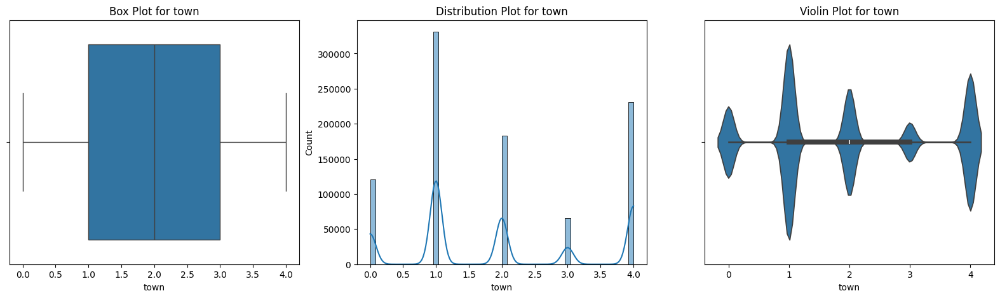

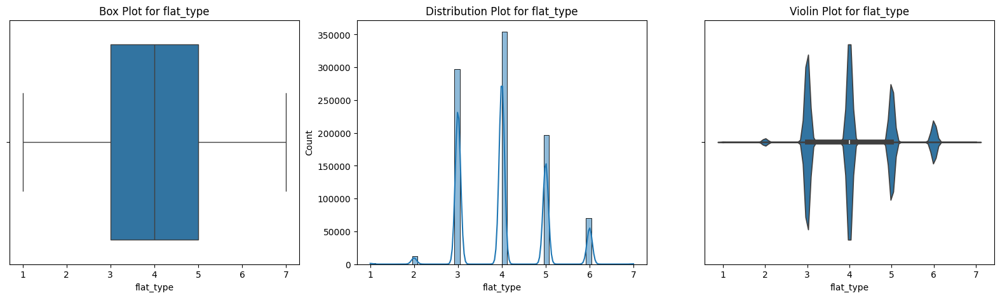

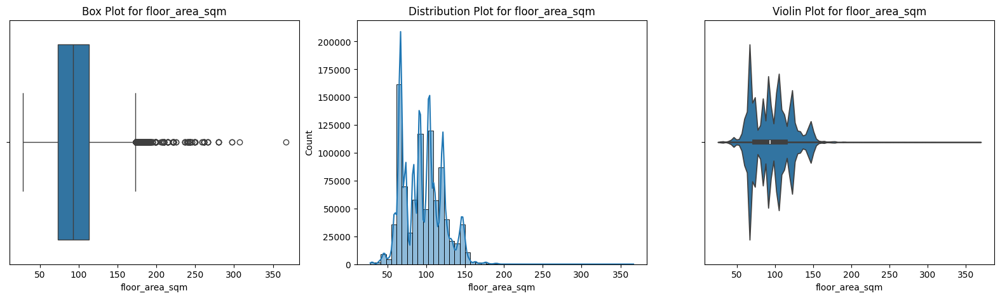

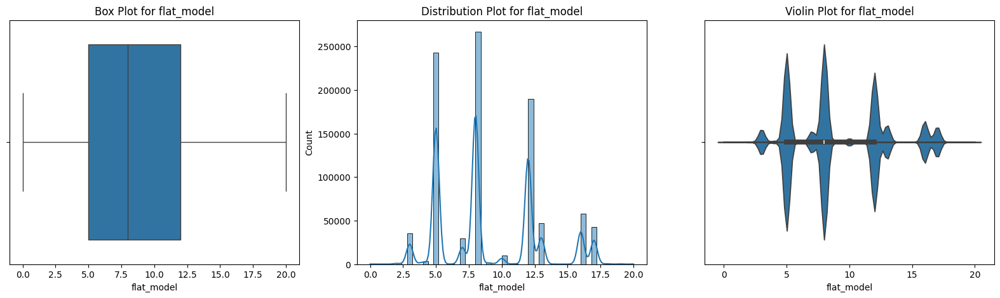

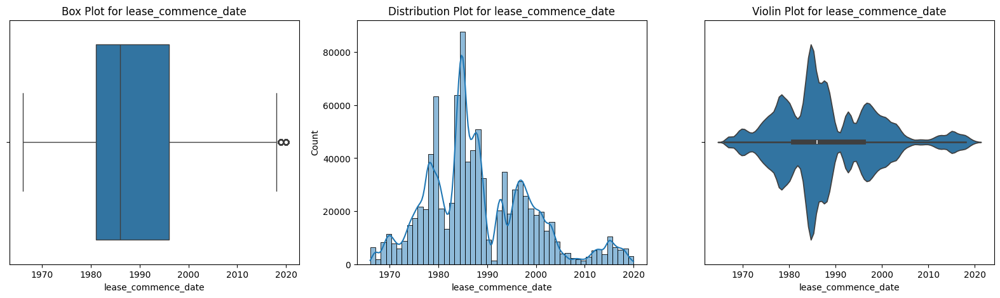

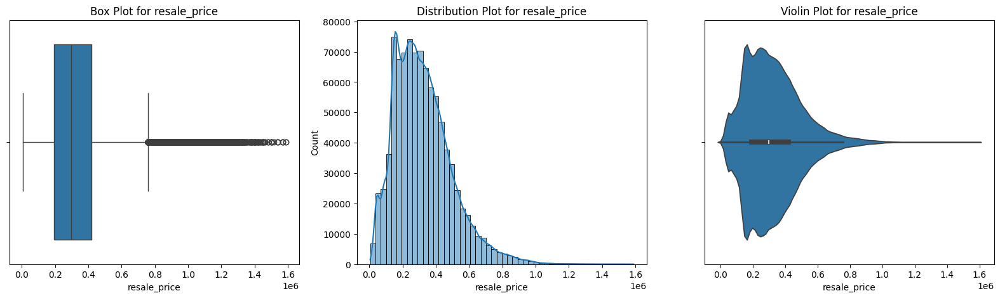

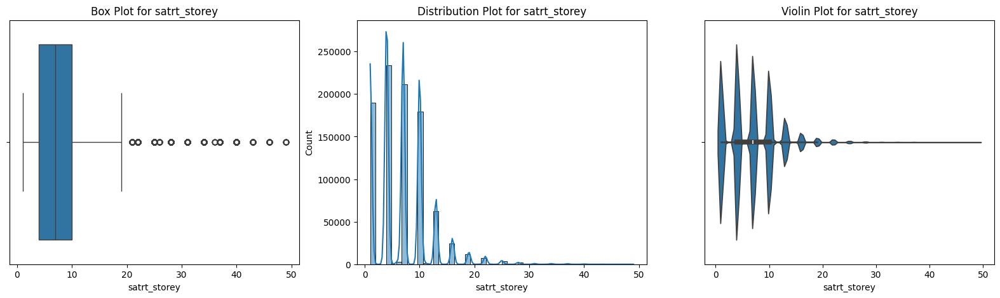

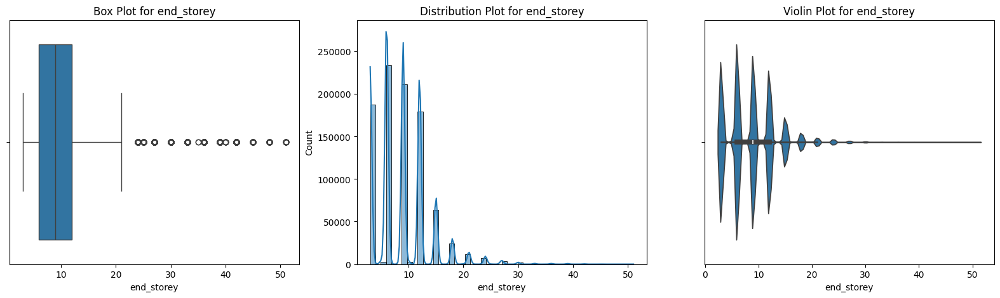

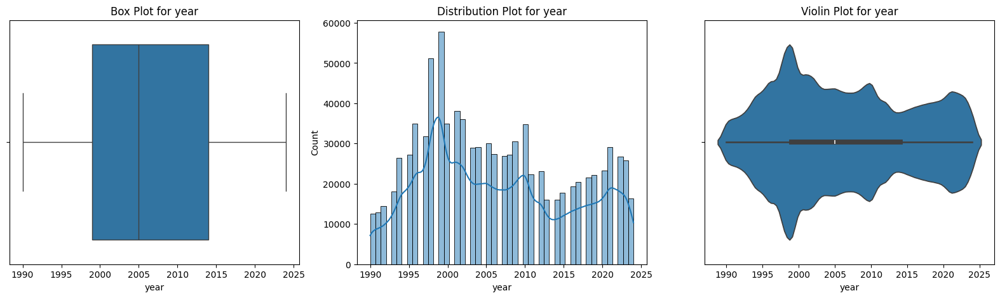

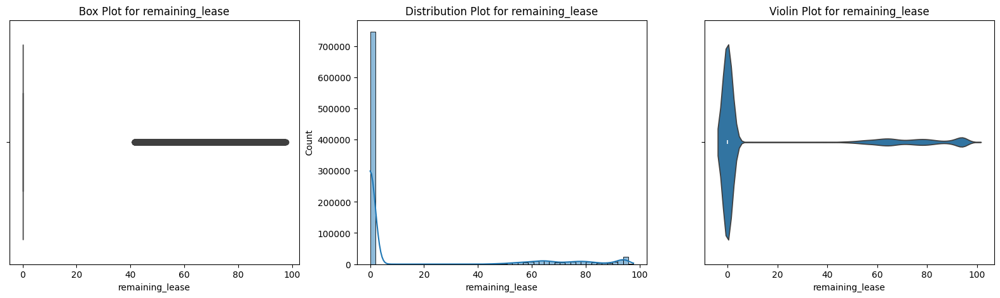

In [87]:
for i in ['town', 'flat_type', 'floor_area_sqm', 'flat_model', 'lease_commence_date', 'resale_price', 'satrt_storey', 'end_storey','year','remaining_lease']:
    plot(combined_df, i)

In [89]:
# square area and resale price having higher ouliers we need to sort it using IQR
# Using IQR and clip() methods to handle the outliers and add a new column of dataframe

def outlier(df, column):
    iqr = df[column].quantile(0.75) - df[column].quantile(0.25)
    upper_threshold = df[column].quantile(0.75) + (1.5*iqr)
    lower_threshold = df[column].quantile(0.25) - (1.5*iqr)
    df[column] = df[column].clip(lower_threshold, upper_threshold)

In [90]:
# fill remaing lease with 0
combined_df['remaining_lease']=combined_df['remaining_lease'].fillna(0)

In [91]:
combined_df_iqr = combined_df.copy()

In [92]:
outlier(combined_df_iqr,'resale_price')
outlier(combined_df_iqr,'floor_area_sqm')

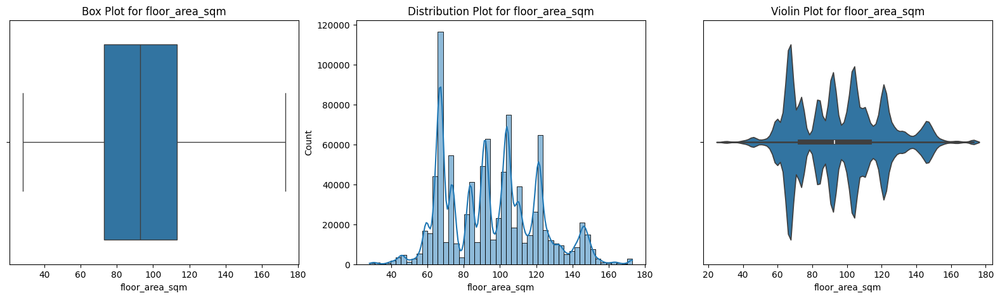

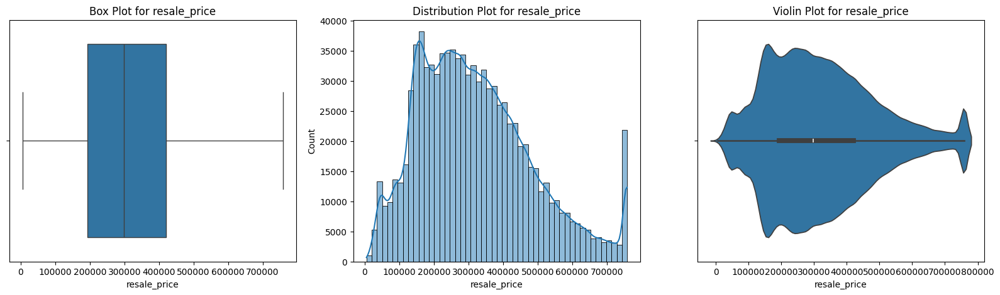

In [93]:
for i in ['floor_area_sqm','resale_price']:
    plot(combined_df_iqr, i)

In [94]:
coorelation_matrix = combined_df_iqr.corr()

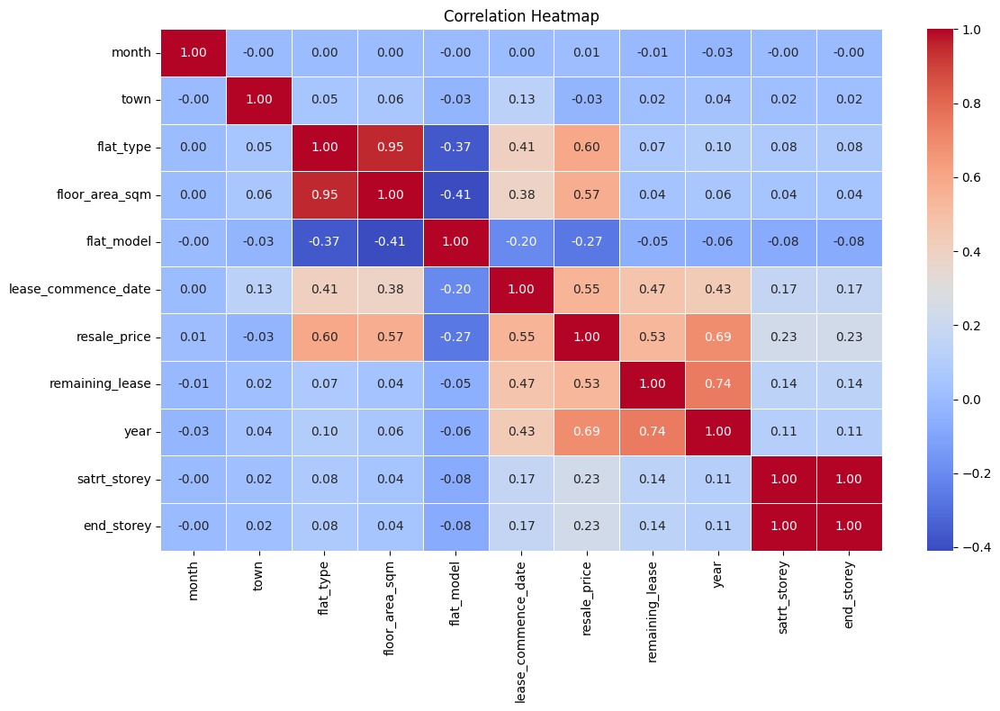

In [95]:
plt.figure(figsize=(12, 8))
sns.heatmap(coorelation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.tight_layout()

In [96]:
combined_df_iqr.head(4)

,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease,year,satrt_storey,end_storey
0,1,0,1,31.0,5,1977,9000.0,0.0,1990,10,12
1,1,0,1,31.0,5,1977,6000.0,0.0,1990,4,6
2,1,0,1,31.0,5,1977,8000.0,0.0,1990,10,12
3,1,0,1,31.0,5,1977,6000.0,0.0,1990,7,9


In [97]:

# Filter rows where 'remaining_lease' is not null
df_with_lease = combined_df_iqr[combined_df_iqr['remaining_lease']>0]
df_without_lease = combined_df_iqr[combined_df_iqr['remaining_lease']==0]

In [98]:
df_with_lease.shape

(185506, 11)

In [99]:
df_without_lease.shape

(746203, 11)

In [100]:
df_without_lease = df_without_lease.reset_index(drop=True)
df_without_lease

,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease,year,satrt_storey,end_storey
0,1,0,1,31.0,5,1977,9000.0,0.0,1990,10,12
1,1,0,1,31.0,5,1977,6000.0,0.0,1990,4,6
2,1,0,1,31.0,5,1977,8000.0,0.0,1990,10,12
3,1,0,1,31.0,5,1977,6000.0,0.0,1990,7,9
4,1,0,3,73.0,12,1976,47200.0,0.0,1990,4,6
...,...,...,...,...,...,...,...,...,...,...,...
746198,12,2,5,112.0,5,2000,488000.0,0.0,2016,13,15
746199,12,2,5,122.0,5,1987,455000.0,0.0,2016,1,3
746200,12,2,6,173.0,3,1992,759000.0,0.0,2016,10,12
746201,12,2,6,146.0,7,1988,575000.0,0.0,2016,1,3


In [101]:
df_with_lease = df_with_lease.reset_index(drop=True)
df_with_lease

,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease,year,satrt_storey,end_storey
0,1,0,2,44.0,5,1979,232000.0,61.333333,2017,10,12
1,1,0,3,67.0,12,1978,250000.0,60.583333,2017,1,3
2,1,0,3,67.0,12,1980,262000.0,62.416667,2017,1,3
3,1,0,3,68.0,12,1980,265000.0,62.083333,2017,4,6
4,1,0,3,67.0,12,1980,265000.0,62.416667,2017,1,3
...,...,...,...,...,...,...,...,...,...,...,...
185501,7,2,6,146.0,7,1988,759000.0,63.083333,2024,4,6
185502,7,2,6,145.0,3,1988,759000.0,63.083333,2024,10,12
185503,7,2,6,146.0,7,1985,759000.0,60.250000,2024,1,3
185504,7,2,6,146.0,7,1985,759000.0,60.166667,2024,4,6


In [102]:
# first we need to train the model using data with remaing lease values and then predict the lease values with data that does not have lease values
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor

In [103]:
df_with_lease.columns

Index(['month', 'town', 'flat_type', 'floor_area_sqm', 'flat_model',
       'lease_commence_date', 'resale_price', 'remaining_lease', 'year',
       'satrt_storey', 'end_storey'],
      dtype='object')

In [104]:
# find best algorithm for prediction based on R2, mean absolute error, mean squared error and root mean squared error values

def machine_learning_remaining_lease(df, algorithm):

    y = df['remaining_lease']
    x = df.drop(columns=['remaining_lease'], axis=1)
    
    x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2)

    model = algorithm().fit(x_train, y_train)
    y_pred = model.predict(x_test)

    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    metrics = {'Algorithm': str(algorithm).split("'")[1].split(".")[-1],
               'R2': r2,
               'Mean Absolute Error': mae,
               'Mean Squared Error': mse,
               'Root Mean Squared Error': rmse}

    return metrics

In [105]:
print(machine_learning_remaining_lease(df_with_lease, DecisionTreeRegressor))
print(machine_learning_remaining_lease(df_with_lease, ExtraTreesRegressor))
print(machine_learning_remaining_lease(df_with_lease, RandomForestRegressor))
print(machine_learning_remaining_lease(df_with_lease, AdaBoostRegressor))
print(machine_learning_remaining_lease(df_with_lease, GradientBoostingRegressor))
print(machine_learning_remaining_lease(df_with_lease, XGBRegressor))

{'Algorithm': 'DecisionTreeRegressor', 'R2': 0.9994637793075799, 'Mean Absolute Error': 0.23240174234392877, 'Mean Squared Error': 0.10472043754005472, 'Root Mean Squared Error': 0.3236053731631394}
{'Algorithm': 'ExtraTreesRegressor', 'R2': 0.9996439942085437, 'Mean Absolute Error': 0.19755603733551436, 'Mean Squared Error': 0.06976371957349844, 'Root Mean Squared Error': 0.26412822562819455}
{'Algorithm': 'RandomForestRegressor', 'R2': 0.9996947512534232, 'Mean Absolute Error': 0.1893329457080333, 'Mean Squared Error': 0.05984863035575056, 'Root Mean Squared Error': 0.24463979716258466}
{'Algorithm': 'AdaBoostRegressor', 'R2': 0.9843950912213699, 'Mean Absolute Error': 1.482912732558635, 'Mean Squared Error': 3.0558098102444915, 'Root Mean Squared Error': 1.7480874721376192}
{'Algorithm': 'GradientBoostingRegressor', 'R2': 0.9994300975572168, 'Mean Absolute Error': 0.2716741220397868, 'Mean Squared Error': 0.11127996552179877, 'Root Mean Squared Error': 0.3335865187950478}
{'Algorith

In [63]:
# RandomForestRegressor and XGBRegressor both have very high R2 scores and perform similarly in MAE, MSE, and RMSE.
# XGBRegressor has the lowest MSE and RMSE, indicating it has slightly better performance in terms of minimizing errors.
# Using the RandomForestRegressor could be beneficial, especially if you prefer its characteristics or find it easier to tune or deploy. If computational resources or ease of use are factors, it’s a solid choice.

In [106]:
# now train the model with

def ml_remaining_lease(df_with_lease, df_without_lease, batch_size=10000):
    y = df_with_lease["remaining_lease"]
    x = df_with_lease.drop(columns=["remaining_lease"], axis=1)
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2)

    model = RandomForestRegressor().fit(x_train, y_train)

    y_pred_list = []
    num_batches = int(np.ceil(len(df_without_lease) / batch_size))

    for i in range(num_batches):
        print('inside processing bacth')
        start_index = i * batch_size
        end_index = min((i + 1) * batch_size, len(df_without_lease))
        batch = df_without_lease.iloc[start_index:end_index]

        input_data = batch.drop(columns=["remaining_lease"], axis=1)
        y_pred_batch = model.predict(input_data)
        y_pred_list.extend(y_pred_batch)

    return y_pred_list


In [107]:
# Machine learning model predict the remaing_lease 
remaing_lease = ml_remaining_lease(df_with_lease, df_without_lease, batch_size=10000)

inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processing bacth
inside processin

In [108]:
print(len(remaing_lease))

746203


In [109]:
remaing_lease1 = [int(round(i,0)) for i in remaing_lease]
print(remaing_lease)

[59.53916666666666, 59.54833333333332, 59.53916666666666, 59.54583333333332, 58.19999999999999, 59.575833333333314, 59.62166666666666, 59.60083333333332, 59.62583333333333, 59.575833333333314, 59.62166666666666, 58.18166666666665, 58.18249999999998, 59.62166666666666, 59.609999999999985, 60.35916666666665, 59.59916666666664, 59.62166666666666, 60.634999999999984, 60.62916666666666, 60.36166666666662, 60.347499999999954, 60.30916666666665, 60.36583333333332, 60.62916666666666, 60.347499999999954, 60.35083333333332, 60.30916666666665, 60.634999999999984, 61.36749999999999, 61.22083333333331, 60.658333333333296, 60.658333333333296, 60.33333333333332, 61.31499999999997, 61.31499999999997, 61.344999999999985, 61.37833333333331, 61.36916666666666, 61.34499999999999, 61.34499999999999, 61.31749999999999, 61.344999999999985, 61.31749999999999, 61.31749999999999, 61.31749999999999, 61.34416666666666, 61.31499999999997, 61.212499999999984, 61.221666666666614, 61.221666666666614, 61.3174999999999

In [110]:
df_without_lease['remaining_lease'] = pd.DataFrame(remaing_lease)

In [111]:
df_without_lease.head(100)

,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease,year,satrt_storey,end_storey
0,1,0,1,31.0,5,1977,9000.0,59.539167,1990,10,12
1,1,0,1,31.0,5,1977,6000.0,59.548333,1990,4,6
2,1,0,1,31.0,5,1977,8000.0,59.539167,1990,10,12
3,1,0,1,31.0,5,1977,6000.0,59.545833,1990,7,9
4,1,0,3,73.0,12,1976,47200.0,58.200000,1990,4,6
...,...,...,...,...,...,...,...,...,...,...,...
95,1,0,3,68.0,12,1980,45600.0,62.117500,1990,1,3
96,1,0,3,68.0,12,1980,47000.0,62.117500,1990,1,3
97,1,0,3,68.0,12,1981,52000.0,63.095000,1990,7,9
98,1,0,3,68.0,12,1981,43000.0,63.095000,1990,7,9


In [112]:
final_lease_df =pd.concat([df_with_lease,df_without_lease],ignore_index=True)

In [113]:
final_lease_df

,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,remaining_lease,year,satrt_storey,end_storey
0,1,0,2,44.0,5,1979,232000.0,61.333333,2017,10,12
1,1,0,3,67.0,12,1978,250000.0,60.583333,2017,1,3
2,1,0,3,67.0,12,1980,262000.0,62.416667,2017,1,3
3,1,0,3,68.0,12,1980,265000.0,62.083333,2017,4,6
4,1,0,3,67.0,12,1980,265000.0,62.416667,2017,1,3
...,...,...,...,...,...,...,...,...,...,...,...
931704,12,2,5,112.0,5,2000,488000.0,81.915833,2016,13,15
931705,12,2,5,122.0,5,1987,455000.0,68.894167,2016,1,3
931706,12,2,6,173.0,3,1992,759000.0,73.585833,2016,10,12
931707,12,2,6,146.0,7,1988,575000.0,69.637500,2016,1,3


In [73]:
# Now predicting resale price

In [114]:
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
import pickle

In [115]:
final_lease_df.columns

Index(['month', 'town', 'flat_type', 'floor_area_sqm', 'flat_model',
       'lease_commence_date', 'resale_price', 'remaining_lease', 'year',
       'satrt_storey', 'end_storey'],
      dtype='object')

In [116]:
def machine_learning_regression(df, algorithm):

    y = df_with_lease["resale_price"]
    x = df_with_lease.drop(columns=["resale_price"], axis=1)
    x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

    model = algorithm().fit(x_train, y_train)
    y_pred_train = model.predict(x_train)
    y_pred_test = model.predict(x_test)
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)

    # algo = str(algorithm).split("'")[1].split(".")[-1]
    accuracy_metrics = {'algorithm': algorithm.__name__,
                        'R2_train' : r2_train,
                        'R2_test'  : r2_test}

    return accuracy_metrics

In [117]:

print(machine_learning_regression(final_lease_df, DecisionTreeRegressor))
print(machine_learning_regression(final_lease_df, ExtraTreesRegressor))
print(machine_learning_regression(final_lease_df, RandomForestRegressor))
print(machine_learning_regression(final_lease_df, AdaBoostRegressor))
print(machine_learning_regression(final_lease_df, GradientBoostingRegressor))
print(machine_learning_regression(final_lease_df, XGBRegressor))

{'algorithm': 'DecisionTreeRegressor', 'R2_train': 0.9984244781525595, 'R2_test': 0.8739248764482477}
{'algorithm': 'ExtraTreesRegressor', 'R2_train': 0.9984237299279786, 'R2_test': 0.9217948466261174}
{'algorithm': 'RandomForestRegressor', 'R2_train': 0.9889496536660053, 'R2_test': 0.9273595193820687}
{'algorithm': 'AdaBoostRegressor', 'R2_train': 0.6060365524031057, 'R2_test': 0.6066825605372632}
{'algorithm': 'GradientBoostingRegressor', 'R2_train': 0.8585881975762102, 'R2_test': 0.8579566742262963}
{'algorithm': 'XGBRegressor', 'R2_train': 0.925833508404579, 'R2_test': 0.9204759648334204}


In [95]:
# RandomForestRegressor: R²_train = 0.9889, R²_test = 0.9275 (Overfitting is present but not excessive)
# ExtraTreesRegressor: R²_train = 0.9984, R²_test = 0.9220 (High training R² indicates more overfitting)
# XGBRegressor: R²_train = 0.9258, R²_test = 0.9205 (Good balance between training and testing performance)
# GradientBoostingRegressor: R²_train = 0.8586, R²_test = 0.8580 (Good balance with minimal overfitting)
# DecisionTreeRegressor: R²_train = 0.9984, R²_test = 0.8733 (Significant overfitting)
# AdaBoostRegressor: R²_train = 0.6007, R²_test = 0.6018 (Underfitting)

In [76]:
from dask.distributed import Client
import dask.dataframe as dd
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from dask_ml.model_selection import GridSearchCV as DaskGridSearchCV

# Start a Dask client
# client = Client()

# Convert your Pandas DataFrame to a Dask DataFrame
# ddf = dd.from_pandas(final_lease_df, npartitions=10)

y = final_lease_df["resale_price"]
x = final_lease_df.drop(columns=["resale_price"], axis=1)

x_train, x_test, y_train, y_test = train_test_split(x,y,test_size=0.2,random_state=42)

param_grid = {'max_depth'        : [2, 5, 10, 20],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf' : [1, 2, 4],
              'max_features'     : ['sqrt', 'log2']}

grid_search = GridSearchCV(estimator=RandomForestRegressor(), param_grid=param_grid, cv=5, n_jobs=-1)
grid_search.fit(x_train, y_train)
# it took about 65 minutes


GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
             param_grid={'max_depth': [2, 5, 10, 20],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]})

In [79]:
grid_search.best_params_,grid_search.best_score_

({'max_depth': 20,
  'max_features': 'sqrt',
  'min_samples_leaf': 1,
  'min_samples_split': 2},
 0.9652692938422069)

In [86]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn import metrics


y = final_lease_df["resale_price"]
x = final_lease_df.drop(columns=["resale_price"], axis=1)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2)
model = RandomForestRegressor(max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2).fit(x_train, y_train)
y_pred_train = model.predict(x_train)
y_pred_test = model.predict(x_test)


In [87]:
# (0.9783094557209346, 0.9658885144999921) sqrt log
# (0.9830596711317671, 0.9689154332512974) None log
r2_train = r2_score(y_train, y_pred_train)
r2_test = r2_score(y_test, y_pred_test)
r2_train, r2_test

(0.9830596711317671, 0.9689154332512974)

In [88]:
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_test)
mae = mean_absolute_error(y_test, y_pred_test)

metrics_r = {'R2': r2,
           'Mean Absolute Error': mae,
           'Mean Squared Error': mse,
           'Root Mean Squared Error': rmse}

metrics_r
# without hyper
# {'R2': 0.9695488348480532,
#  'Mean Absolute Error': 18818.448478532613,
#  'Mean Squared Error': 823628095.371837,
#  'Root Mean Squared Error': 28698.92150189336}

# sqrt
# {'R2': 0.9658885144999921,
#  'Mean Absolute Error': 20767.88000911076,
#  'Mean Squared Error': 920734474.6556491,
#  'Root Mean Squared Error': 30343.606816851043}

{'R2': 0.9689154332512974,
 'Mean Absolute Error': 19231.77968234544,
 'Mean Squared Error': 837509554.9039092,
 'Root Mean Squared Error': 28939.757340100645}

In [89]:
user_data = np.array([[1,0,2,44.0,5,1979,61.333333,2017,10,12]])
y_pred = model.predict(user_data)
y_pred[0]

c:\Users\venka\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


235735.1209325936

In [90]:
# save the regression model by using pickle

with open('ml_flat_price_model_1_none.pkl', 'wb') as f:
    pickle.dump(model, f)

In [91]:
# load the pickle model to predict selling price
import pickle
import numpy as np
with open('ml_flat_price_model_1_none.pkl', 'rb') as f:
    model = pickle.load(f)

y_pred = model.predict(np.array([[1,0,2,44.0,5,1979,61.333333,2017,10,12]]))
y_pred[0]

c:\Users\venka\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


235735.1209325936